In [125]:
#Libraries we need

import warnings
warnings.filterwarnings("ignore")

import rasterio
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import matplotlib

import os

from rasterio.plot import show
from rasterio.plot import plotting_extent
from rasterio.mask import mask

from funciones import nequalize, plot_rgb, delNone


# os.chdir("C:\\Users\\arell\\Documents\\Sentinel") #Change to the directory where you are working

In [126]:
#directory where the image is located
# s2 = rasterio.open('ImagenesSentinel/Sur_20mTODOS.tif') #Bands 2,3,4 and 8 
s2 = rasterio.open('ImagenesSentinel/Norte_20mTODOS.tif') #Bands 2,3,4 and 8 
s2_bandas = s2.read()
s2_bandas.shape #(number of bands, image height, image width)

(11, 3812, 1750)

In [127]:
#Coord. system
print(s2.crs)

#Extent:
print(s2.bounds)

EPSG:32720
BoundingBox(left=330331.85, bottom=6521930.05, right=365331.85, top=6598170.05)


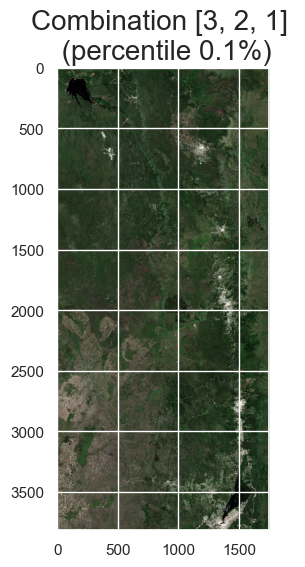

In [128]:
plot_rgb(s2_bandas, [3,2,1], p=0.1) #Plots the selected bands (indexing starts at 0: 3=Red, 2=Green, 1=Blue), with 5% percentile

In [129]:
radios = gpd.read_file('Poligonos/Embalses_unificado.shp')#.set_index('id') #Loads shp file
radios.drop(columns=['path', 'objeto','entidad','layer'], inplace = True)
radios['id'] = np.linspace(0,10,11).astype(int)
radios.set_index('id')

,gid,fna,Superficie,geometry
id,,,,
0,33857,Cerro Pelado,12.50,"POLYGON ((344214.773 6437426.358, 344209.609 6..."
1,30894,Los Molinos,19.40,"POLYGON ((352710.323 6479131.072, 352714.094 6..."
2,33861,Rio Tercero,46.44,"POLYGON ((365970.151 6439668.417, 365953.147 6..."
3,33879,Pichanas,4.09,"POLYGON ((291335.467 6578390.734, 291299.608 6..."
4,33880,Cruz del Eje,10.29,"POLYGON ((332232.611 6595717.129, 332232.269 6..."
5,33882,La ViÃ±a,5.67,"POLYGON ((307311.654 6472607.89, 307115.235 64..."
6,33884,Usina 3,2.67,"POLYGON ((375123.493 6437419.686, 375060.939 6..."
7,33885,Piedra Mora,8.75,"POLYGON ((375880.378 6437539.201, 375741.044 6..."
8,7814,San Roque,13.30,"POLYGON ((362251.484 6527725.212, 362201.415 6..."


In [130]:
radios.crs #shp metadata

<Projected CRS: EPSG:32720>
Name: WGS 84 / UTM zone 20S
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 66°W and 60°W, southern hemisphere between 80°S and equator, onshore and offshore. Argentina. Bolivia. Brazil. Falkland Islands (Malvinas). Paraguay.
- bounds: (-66.0, -80.0, -60.0, 0.0)
Coordinate Operation:
- name: UTM zone 20S
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [131]:
Norte = ['Cruz del Eje','San Roque','El Cajon']
Sur = ['Cerro Pelado','Los Molinos','Rio Tercero','La ViÃ±a','Usina 3','Piedra Mora','Arroyo Corto']

radiosN = radios.query('fna in @Norte')
radiosS = radios.query('fna in @Sur')
radiosS

,gid,fna,Superficie,geometry,id
0,33857,Cerro Pelado,12.50,"POLYGON ((344214.773 6437426.358, 344209.609 6...",0
1,30894,Los Molinos,19.40,"POLYGON ((352710.323 6479131.072, 352714.094 6...",1
2,33861,Rio Tercero,46.44,"POLYGON ((365970.151 6439668.417, 365953.147 6...",2
5,33882,La ViÃ±a,5.67,"POLYGON ((307311.654 6472607.89, 307115.235 64...",5
6,33884,Usina 3,2.67,"POLYGON ((375123.493 6437419.686, 375060.939 6...",6
7,33885,Piedra Mora,8.75,"POLYGON ((375880.378 6437539.201, 375741.044 6...",7
9,33856,Arroyo Corto,3.33,"POLYGON ((351787.95 6434661.122, 351798.854 64...",9


In [132]:
Norte

['Cruz del Eje', 'San Roque', 'El Cajon']

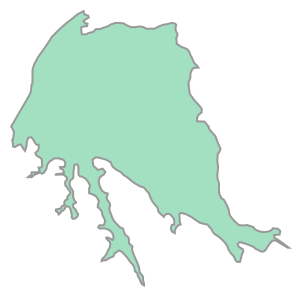

In [133]:
Sur_corregidos = ['Allende','Cerro Pelado','Rio Tercero','Los Molinos','Arroyo Corto','Usina 3','Sin Nombre2','Piedra Mora']
radiosSur_in = gpd.read_file('Poligonos/Sur/PoligonosEmbalsesSur18-10.shp')
radiosSur_in.loc[1].geometry

Norte_corregidos = ['Cruz del eje', 'El Cajon', 'San Roque']
radiosNorte_in = gpd.read_file('Poligonos/Norte/PoligonosEmbalses18-10.shp')
radiosNorte_in.loc[0].geometry

In [134]:
radiosSur = radiosSur_in.assign(fna=Sur_corregidos)
radiosNorte = radiosNorte_in.assign(fna=Norte_corregidos)

In [135]:
radiosSur.set_index('fna')
radiosSur.drop(columns=['id'], inplace = True)
radiosSur = radiosSur[['fna','geometry']]

radiosNorte.set_index('fna')
radiosNorte.drop(columns=['id'], inplace = True)
radiosNorte = radiosNorte[['fna','geometry']]
radiosSur

,fna,geometry
0,Allende,"POLYGON ((309760 6477420, 309780 6477420, 3097..."
1,Cerro Pelado,"POLYGON ((344100 6437120, 344120 6437120, 3441..."
2,Rio Tercero,"POLYGON ((365320 6440880, 365380 6440880, 3653..."
3,Los Molinos,"POLYGON ((354400 6483300, 354420 6483300, 3544..."
4,Arroyo Corto,"POLYGON ((351300 6434980, 351320 6434980, 3513..."
5,Usina 3,"POLYGON ((371960 6438900, 371980 6438900, 3719..."
6,Sin Nombre2,"POLYGON ((367740 6441120, 367760 6441120, 3677..."
7,Piedra Mora,"POLYGON ((380320 6441800, 380360 6441800, 3803..."


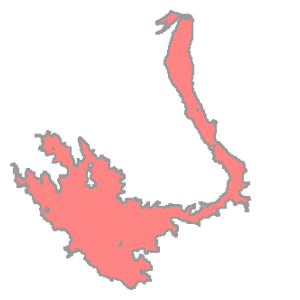

In [136]:
radiosSur.loc[0].geometry

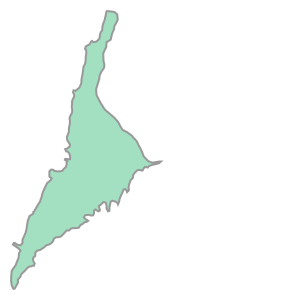

In [137]:
IDEmbalse = 2
nombre = radiosNorte.loc[IDEmbalse].fna
poligono = radiosNorte.loc[IDEmbalse].geometry #geometry of the eighth element of the shp
poligono

In [138]:
s2_plot_extent = plotting_extent(s2) #Edges of the region to plot
s2_plot_extent

(330331.85, 365331.85, 6521930.05, 6598170.05)

In [139]:
# Plot the image with the polygons on top

bandasPosicion = [3,2,1] #Red, Green, Blue (actual band order in the stack: 0=Band1,1=Blue,2=Green,3=Red,...)


# img = nequalize(s2_bandas[bandasPosicion], p=5, nodata = None)
# fig, ax = plt.subplots(figsize = (15,8))
# show(img, ax=ax, extent = s2_plot_extent, cmap = 'gray')
# radiosS.boundary.plot(ax=ax, edgecolor = 'red')
# plt.show()

<Axes: >

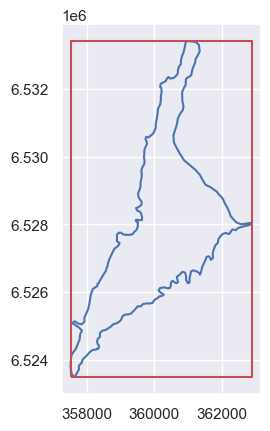

In [140]:
# CROP THE AREA OF INTEREST
extent = poligono.envelope

data = [poligono, extent]
gpd.GeoSeries(data).boundary.plot(color=['b', 'r'])

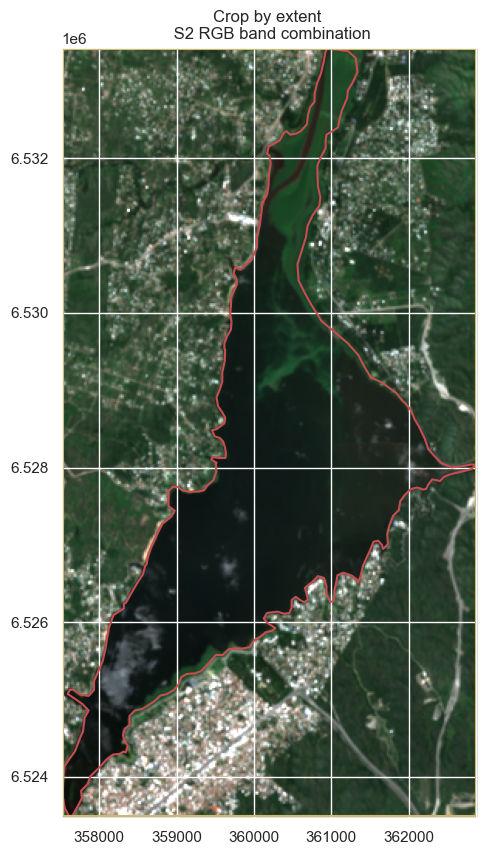

In [141]:
s2_clip, clip_transform = mask(dataset = s2, shapes = [extent], crop = True)
fig, ax = plt.subplots(figsize = (10,10))
show(nequalize(s2_clip[[3,2,1]],p=0.5,nodata = None), ax=ax, transform=clip_transform)
gpd.GeoSeries(data).boundary.plot(ax=ax,color=['r', 'y'])
plt.title("Crop by extent \n S2 RGB band combination")
plt.show()

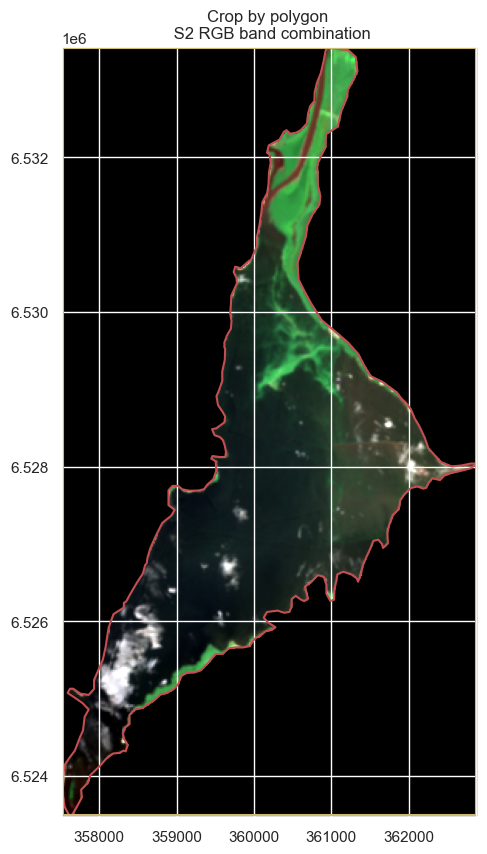

In [142]:
# Keep only what is inside the vector mask
s2_mask, mask_transform  = mask(dataset = s2, shapes = [poligono], crop = True)

fig, ax = plt.subplots(figsize = (10,10))
show(nequalize(s2_mask[bandasPosicion], p=0.5), ax=ax,transform=mask_transform)
gpd.GeoSeries(data).boundary.plot(ax=ax,color=['r', 'y'])
plt.title("Crop by polygon \n S2 RGB band combination")
plt.show()

In [143]:
# s2_rgb = s2_mask[[2,1,0]]/10000
# s2_rgb = s2_rgb[s2_rgb!=0]

# plt.hist(s2_rgb.flatten(), 100); 

In [144]:
reescalado = 10000

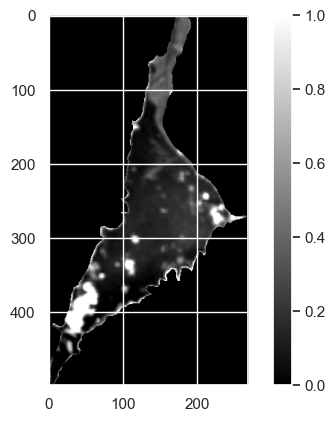

In [145]:
s2_mono = s2_mask[0]/reescalado
plt.imshow(nequalize(s2_mono, p = 5), cmap='gray')
plt.colorbar()

-----------------------------
# Classifiers

In [146]:
from sklearn.cluster import KMeans

In [147]:
raster_fn = 'ImagenesSentinel/Norte_20mTODOS.tif'

with rasterio.open(raster_fn) as src:
    img = src.read()
    crs = src.crs
    gt = src.transform
    
d,x,y = s2_mask.shape
X = s2_mask.reshape([d,x*y]).T
X = X/10000

In [148]:
bandas = ['Band 1', 'Blue', 'Green', 'Red', 'Band 5', 'Band 6', 'Band 7', 'NIR', 'Band 9', 'SWIR 1', 'SWIR 2']

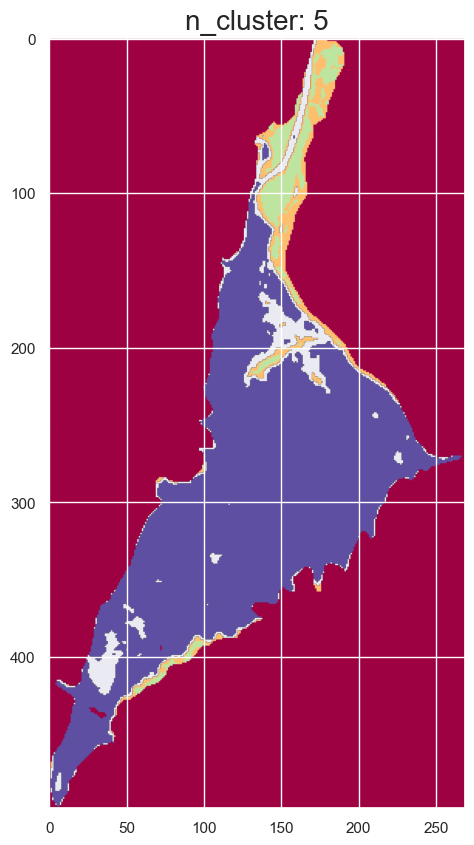

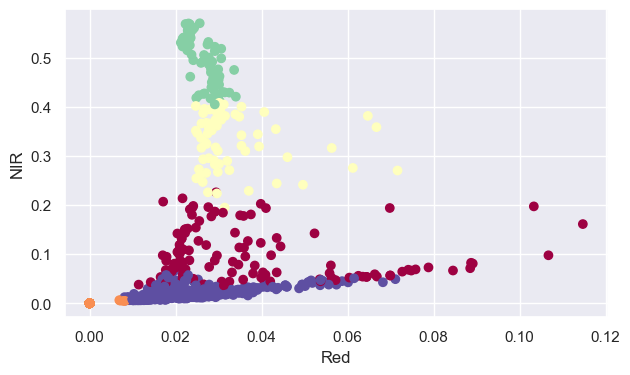

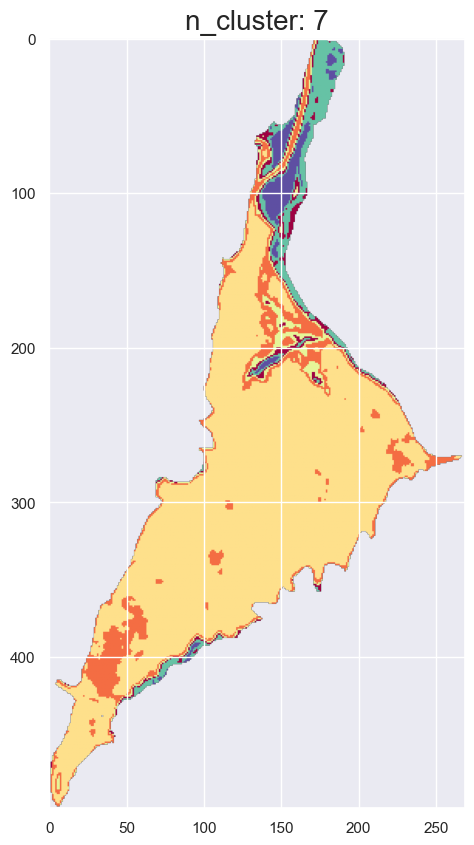

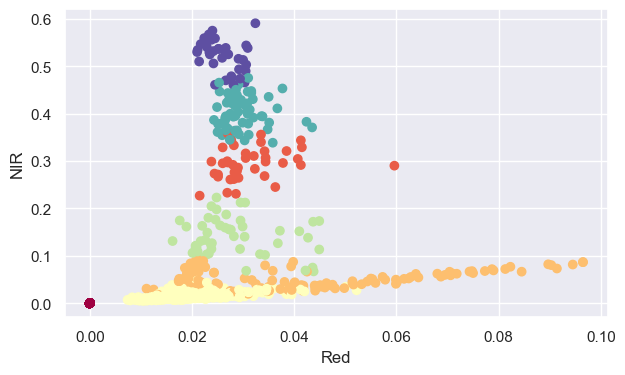

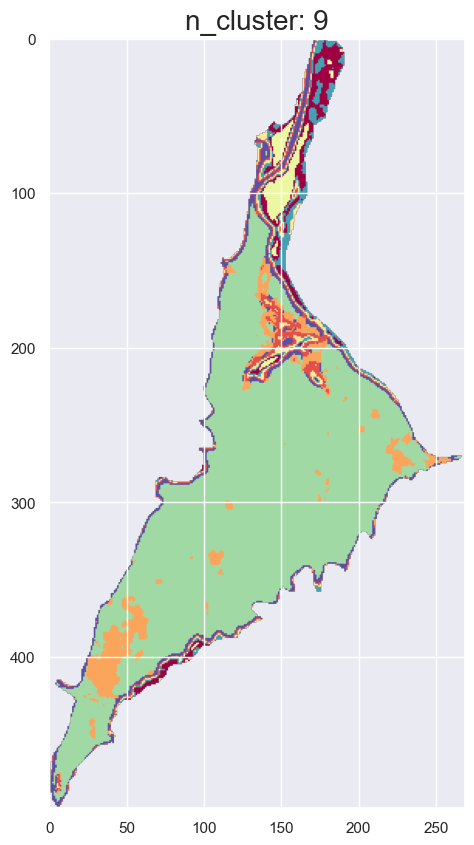

...

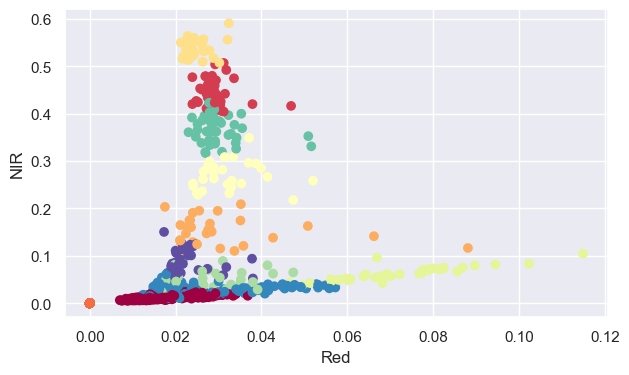

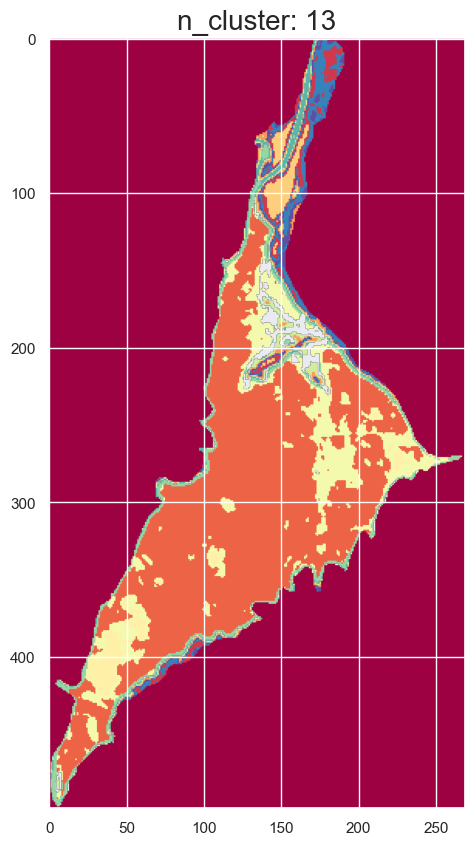

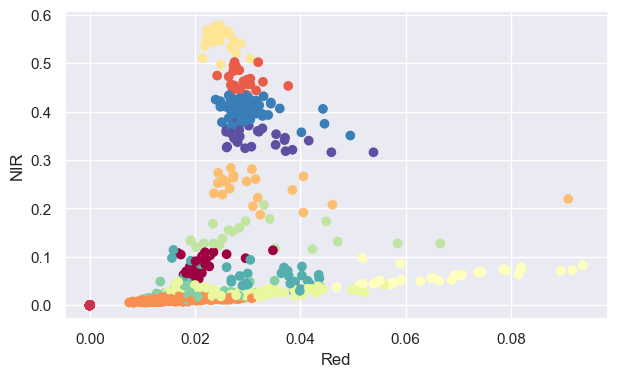

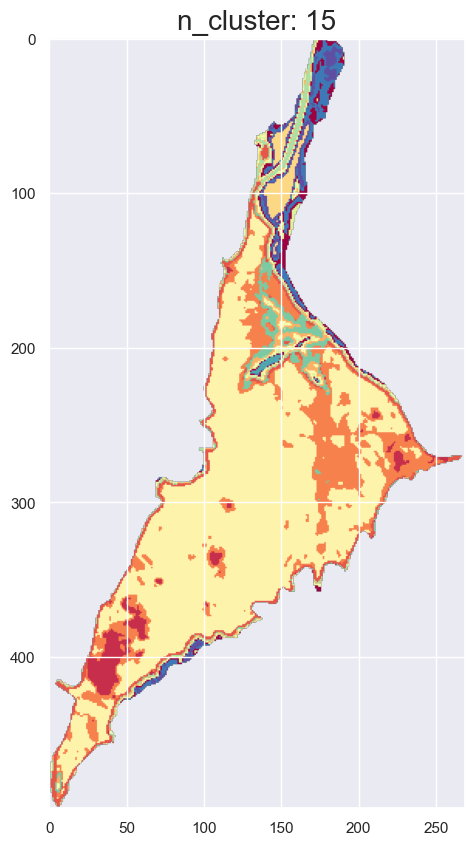

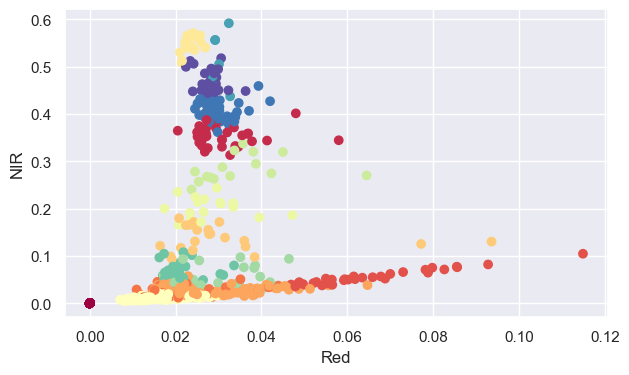

In [149]:
for i in [5,7,9,11,13,15]:
    kmeans = KMeans(n_clusters=i)#, random_state=0)
    kmeans.fit(X)
    L = kmeans.labels_
    Yimg = L.reshape([x,y])
    Yimg = Yimg.astype('float64')
    Yimg[Yimg==0.] = np.nan
    
    plt.figure(figsize=(15,10))
    plt.title('n_cluster: '+str(i), fontsize = 20)
    show(Yimg, cmap='Spectral')
    
    bandx, bandy = 3,7
    
    N = 5000
    R = np.random.randint(low=0, high=X.shape[0],size=N)#X.shape[0])
    plt.figure(figsize=(7,4))
    plt.scatter(X[R,bandx], X[R,bandy], c=L[R], cmap='Spectral')
    plt.xlabel(bandas[bandx])
    plt.ylabel(bandas[bandy])

In [150]:
# from kPOD import k_pod
# # from kPOD import fill_missing_indices

# inputdata = ndvi(s2_mask,2,6,10000)
# # data_missing = fill_missing_indices(s2b, missing_indices)
# clustering_results = k_pod(inputdata, 2)

# cluster_assignments = clustering_results[0]
# cluster_centers = clustering_results[1]

# cluster_assignments, cluster_centers

-----------------
# Spectral signatures


In [151]:
blue = delNone(s2_mask[bandasPosicion[2]],0,reescalado)
green = delNone(s2_mask[bandasPosicion[1]],0,reescalado)
red = delNone(s2_mask[bandasPosicion[0]],0,reescalado)
nir = delNone(s2_mask[7],0,reescalado)  # NIR is at index 7 in this 11-band stack

Text(0.5, 0, 'Nir')

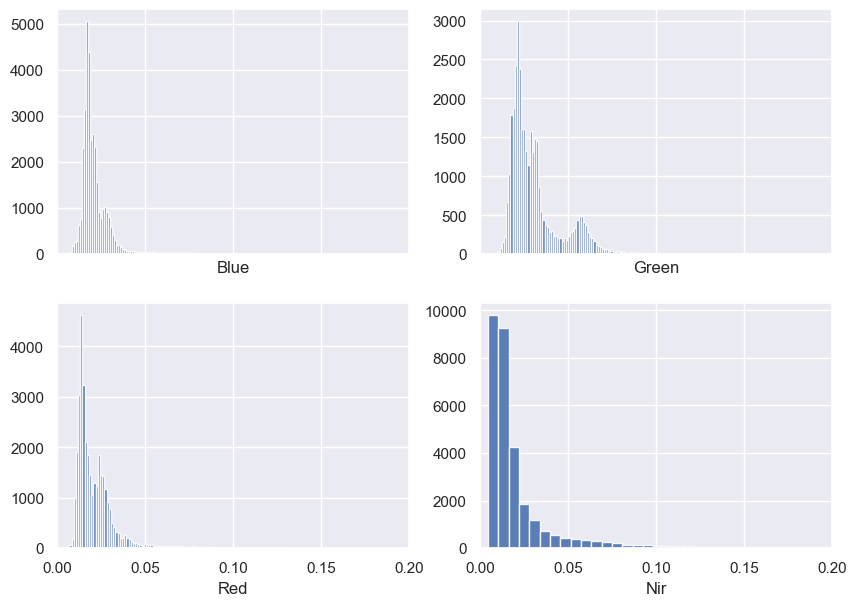

In [152]:
fig, ax = plt.subplots(2,2, sharex = True, figsize = (10,7))
ax[0,0].hist(blue, 100, alpha = 0.9, label = 'Blue');
ax[0,1].hist(green, 100, alpha = 0.9, label = 'Green');
ax[1,0].hist(red, 100, alpha = 0.9, label = 'Red');
ax[1,1].hist(nir, 100, alpha = 0.9, label = 'NIR');
ax[0,0].set_xlim(0,0.2)

ax[0,0].set_xlabel('Blue')
ax[0,1].set_xlabel('Green')
ax[1,0].set_xlabel('Red')
ax[1,1].set_xlabel('Nir')

In [153]:
#Calculates means and standard deviation for each band

[mean_b, mean_g, mean_r, mean_nir] = [np.mean(blue), np.mean(green), np.mean(red), np.mean(nir)]
[std_b, std_g, std_r, std_nir] = [np.std(blue), np.std(green), np.std(red), np.std(nir)]

medias = [mean_b, mean_g, mean_r, mean_nir]
stds = np.asarray([std_b, std_g, std_r, std_nir])
stds = np.asarray([std_b, std_g, std_r, std_nir])/np.sqrt(nir.shape[0])

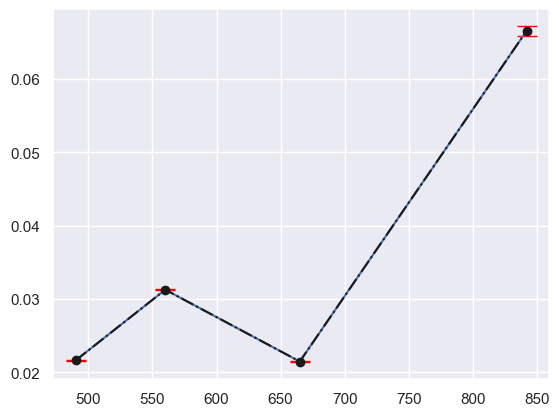

In [154]:
long = [490, 560, 665, 842]

#Perhaps the statistical error should be used instead of the standard deviation as the error
plt.errorbar(long, medias, marker = 'o', yerr = stds, elinewidth = 1, ls = '-.', color = 'k', ecolor = 'red', capsize=7)
plt.plot(long, medias, 'b')


In [155]:
means = []
desvs = []
for i in range(len(s2_mask)):
    aux = delNone(s2_mask[i],0,reescalado)
    means.append(np.mean(aux))
    desvs.append(np.std(aux)/np.sqrt(len(aux)))
    
means = np.asarray(means)
desvs = np.asarray(desvs)

In [156]:
means.shape

(11,)

Text(0, 0.5, 'Reflectance')

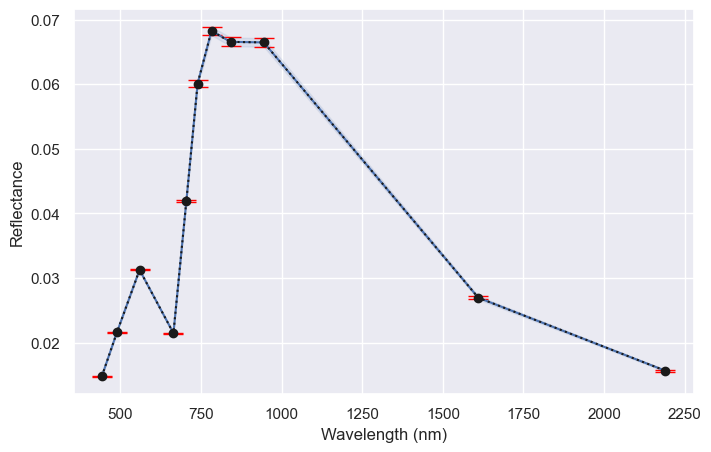

In [157]:
# Wavelengths (nm) matching this stack's actual band order:
# Band1, Blue, Green, Red, Band5, Band6, Band7, NIR, Band9, SWIR1, SWIR2
long = [443, 490, 560, 665, 705, 740, 783, 842, 945, 1610, 2190]


plt.figure(figsize = (8,5))
plt.errorbar(long, means, marker = 'o', yerr = desvs, elinewidth = 1, ls = 'dotted', color = 'k', ecolor = 'red', capsize=7)
plt.plot(long, means)#, label=l)
plt.fill_between(long, means-desvs, (means+desvs), color='b', alpha=.1)
plt.xlabel('Wavelength (nm)')
plt.ylabel('Reflectance')

# font = {'family':'serif', 'color':'darkgray', 'size':11}
# for x,t in zip([490, 560, 665, 842], ['Blue','Green','Red','NIR']):
#     plt.text(x-0.012, 0, t, fontdict=font)

# plt.savefig('Firma_SanRoque.png', dpi = 300)

In [158]:
#Uncomment to save 
# guardar_GTiff('Procesados/S2_mask.tif', s2.crs, mask_transform, s2_mask, meta = {'dtype': 'uint16', 'nodata': 0})

-----------------------
Indices
--------

In [159]:
#Calculate NDVI
def ndvi(array, bandaR, bandaNIR, factor): 
    red = np.asarray(array[bandaR])/factor
    nir = np.asarray(array[bandaNIR])/factor
    
    return (nir-red)/(nir+red)

#Calculate NDWI
def ndwi(array, bandaG, bandaNIR,factor): 
    green = np.asarray(array[bandaG])/factor
    nir = np.asarray(array[bandaNIR])/factor
    
    return (green - nir)/(nir+green)

def indice(array, banda1, banda2, factor): #the band being added in the numerator goes first
    aux1 = np.asarray(array[banda1])/factor
    aux2 = np.asarray(array[banda2])/factor
    
    return (aux1-aux2)/(aux1+aux2)

In [160]:
matplotlib.rc_file_defaults()

Text(0.5, 1.0, 'NDWI - San Roque')

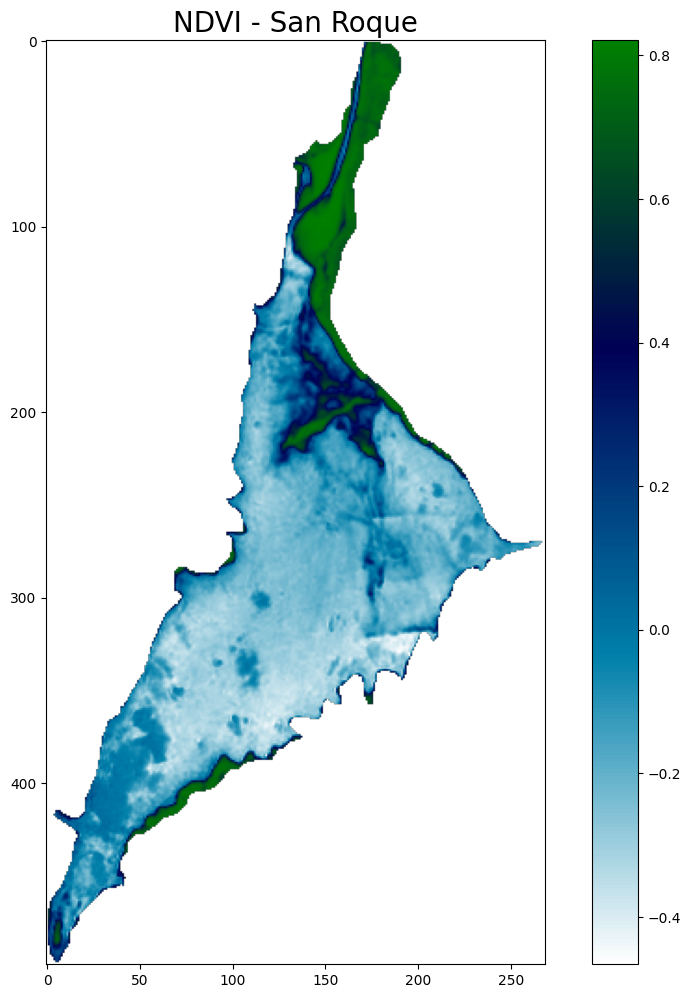

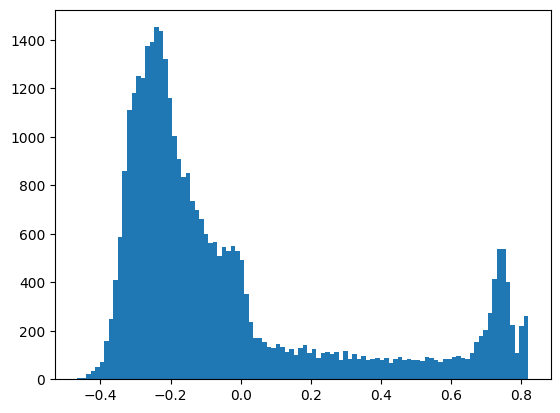

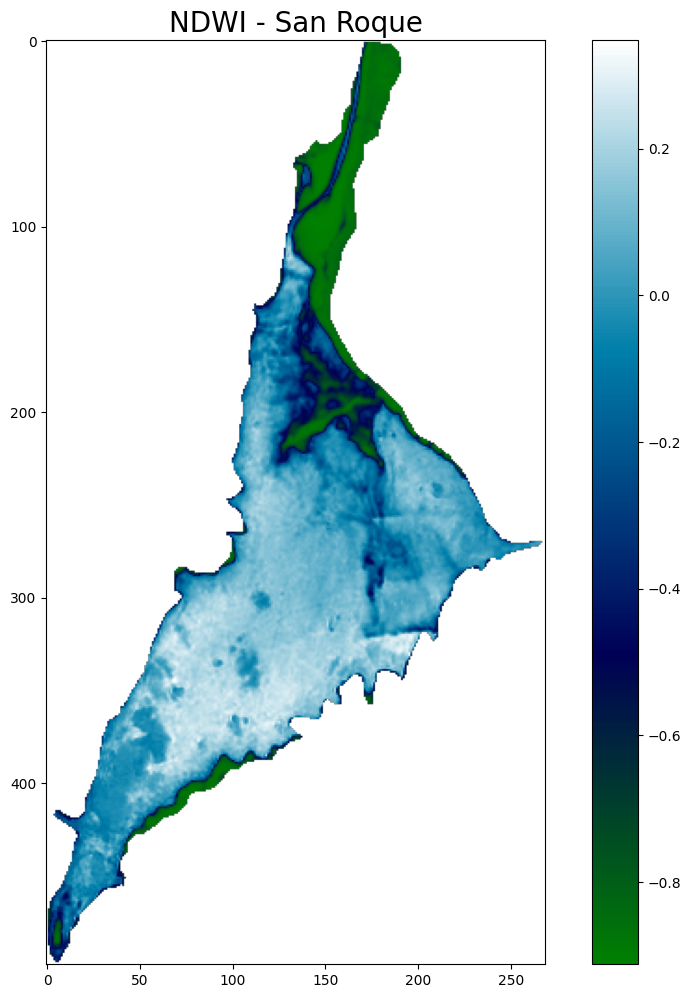

In [161]:
# os.chdir("D:\\Documentos Facultad - Conicet\Cursos\Tele - UNSAM\Scipts")
# Documentos Facultad - Conicet/Cursos/Tele - UNSAM/Scipts/Plots
plt.figure(figsize=(12,12))
plt.imshow(ndvi(s2_mask,2,6, 10000), cmap='ocean_r')
plt.colorbar()
plt.title('NDVI - '+nombre,  fontsize = 20)


plt.figure()
plt.hist(ndvi(s2_mask,2,6, 10000).flatten(), 100)
# # plt.savefig('Plots/ndvi_'+nombre+'.png', dpi = 300)

plt.figure(figsize=(12,12))
plt.imshow(ndwi(s2_mask,1,6,10000), cmap='ocean')
plt.colorbar()
plt.title('NDWI - '+nombre,  fontsize = 20)

# plt.savefig('Plots/ndwi_'+nombre+'.png', dpi = 300)

# os.chdir("C:\\Users\\arell\\Documents\\Sentinel")

In [162]:
indicesTC = [0,1,2,6,7,8] #South
# indicesTC = [2,1,0,6,7,8] #North
matriz = []
matriz2 = []
coeficientesS2 = [[0.3510, 0.3813, 0.3437, 0.7196, 0.2396, 0.1949],
                  [-0.3599, -0.3533, -0.4734, 0.6633, 0.0087, -0.2856],
                  [0.2578, 0.2305, 0.0883, 0.1071, -0.7611, -0.5308]] 

for i in indicesTC:
    matriz.append(s2_clip[i]/reescalado)
    matriz2.append(s2_mask[i]/reescalado)
    
[brillo, verdor, humedad] = np.einsum('ij,jkl->ikl', coeficientesS2,matriz)
[brilloM, verdorM, humedadM] = np.einsum('ij,jkl->ikl', coeficientesS2,matriz2)

In [163]:
brilloM[brilloM==0] = np.nan
verdorM[verdorM==0] = np.nan
humedadM[humedadM==0] = np.nan

Text(0.5, 1.0, 'Brightness - San Roque')

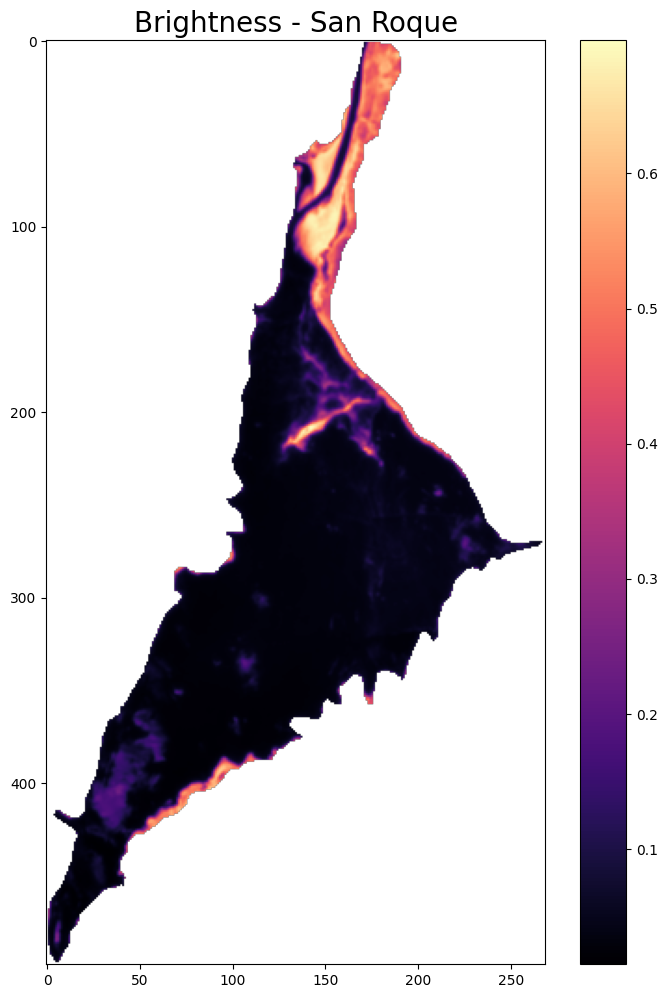

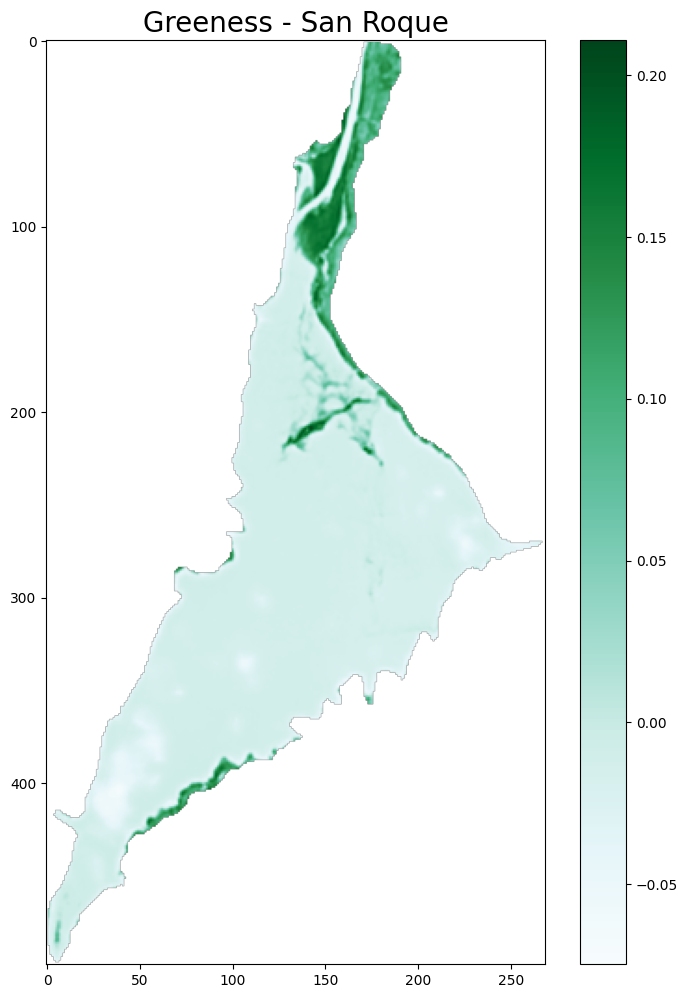

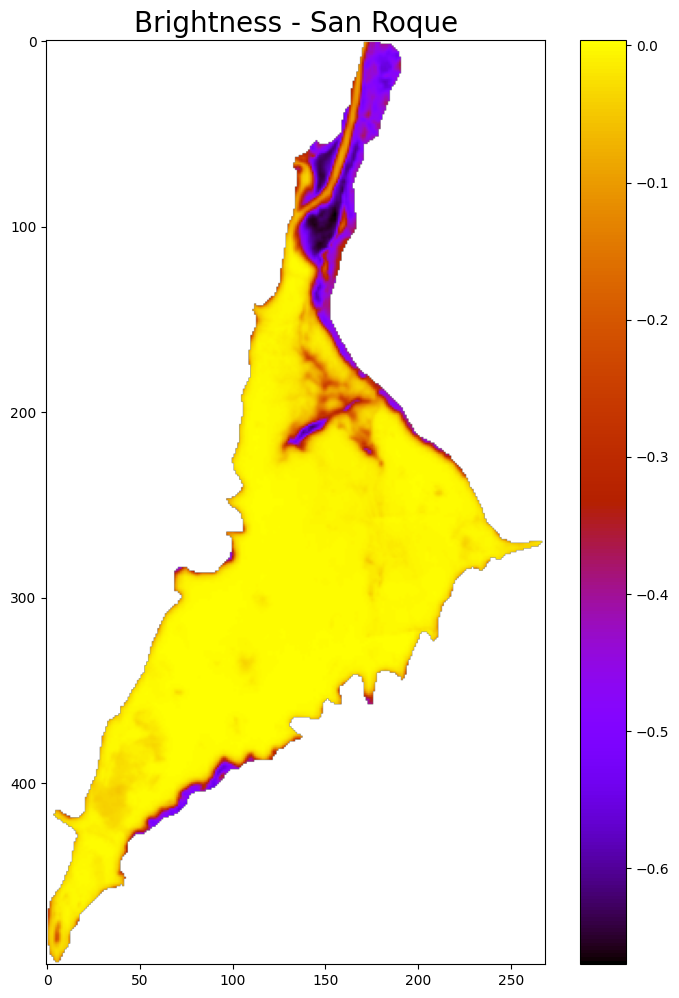

In [164]:
# nombre += '-mask'

masked_arrayB = np.ma.array(brilloM, mask=np.isnan(brilloM))
plt.figure(figsize = (9,12))
plt.imshow(masked_arrayB, cmap='magma')
plt.colorbar()
plt.title('Brightness - '+nombre,  fontsize = 20)
# plt.savefig('Plots/Brightness_'+nombre+'.png', dpi = 300)


masked_arrayV = np.ma.array(verdorM, mask=np.isnan(verdorM))
plt.figure(figsize = (9,12))
plt.imshow(masked_arrayV, cmap='BuGn')
plt.colorbar()
plt.title('Greeness - '+nombre,  fontsize = 20)
# plt.savefig('Plots/Greeness_'+nombre+'.png', dpi = 300)

masked_arrayH = np.ma.array(humedadM, mask=np.isnan(humedadM))
plt.figure(figsize = (9,12))
plt.imshow(masked_arrayH, cmap='gnuplot')
plt.colorbar()
plt.title('Brightness - '+nombre,  fontsize = 20)
# plt.savefig('Plots/Wetness_'+nombre+'.png', dpi = 300)

In [165]:
aux1 = brilloM.flatten()
# aux1 = aux1[aux1!=np.nan]
aux2 = verdorM.flatten()
aux3 = humedadM.flatten()
# plt.hist(aux1)

In [166]:
auxx = aux1[np.isfinite(aux1)]
auxx

array([0.0855025 , 0.16397554, 0.34353642, ..., 0.18336528, 0.05808751,
       0.06338836], shape=(35027,))

<function seaborn.rcmod.reset_orig()>

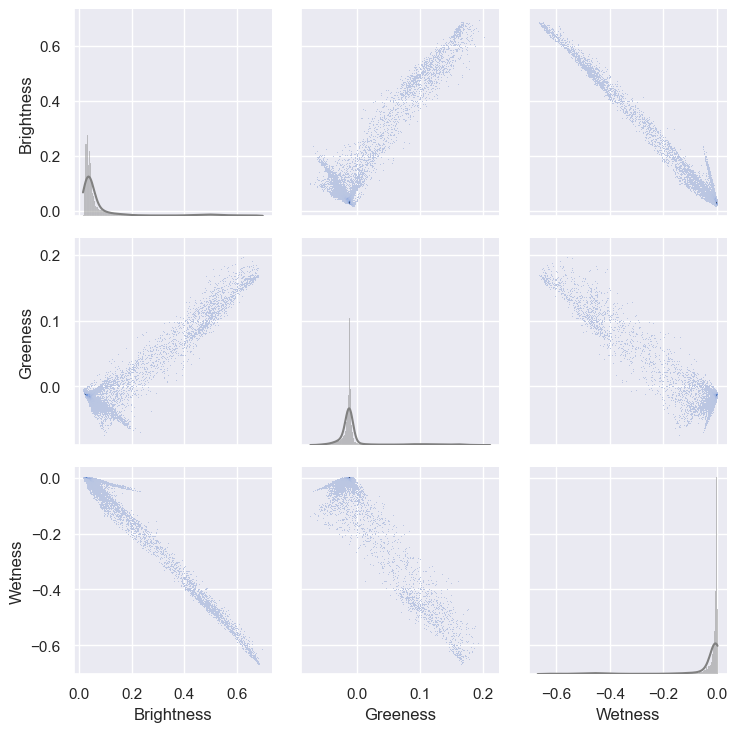

In [167]:
sns.set()
stack_data2 = np.stack((aux1[np.isfinite(aux1)], aux2[np.isfinite(aux2)], aux3[np.isfinite(aux3)])).T
data = pd.DataFrame(stack_data2, columns = ['Brightness','Greeness','Wetness'])

f = sns.PairGrid(data)
# f.fig.suptitle(Nombre, y=1.01, fontsize = 'large')
f.map_upper(sns.histplot)
f.map_lower(sns.histplot)
f.map_diag(sns.histplot, kde=True, color='.5')
# f.set(xlim = (0,0.15), ylim = (0,0.15))
sns.reset_orig

Text(0.5, 0, 'Brightness')

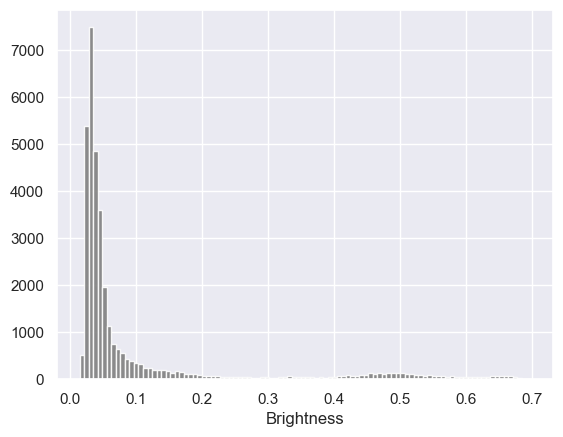

In [168]:
plt.figure()
plt.hist(brilloM[brilloM!=0].flatten(), 100, alpha = 0.9, color='gray');
plt.xlabel('Brightness')

In [169]:
radiosAux = radiosNorte

if radiosAux.shape == radiosSur.shape:
    IDN = [0,1,2,3,4,5,6,7]
else:
    IDN = [0,1,2]
print(IDN)

[0, 1, 2]


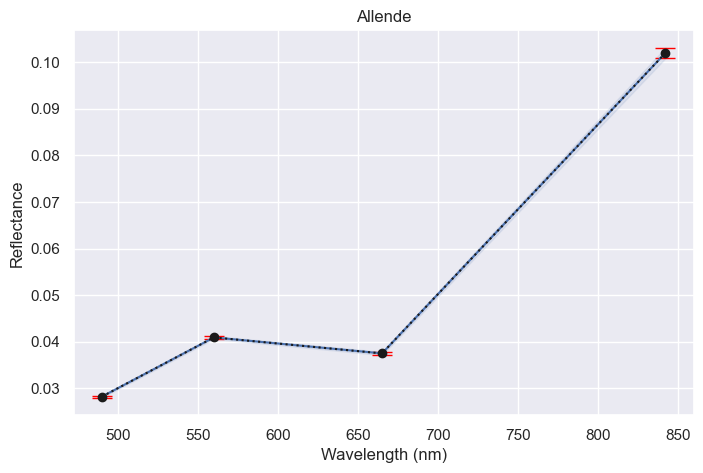

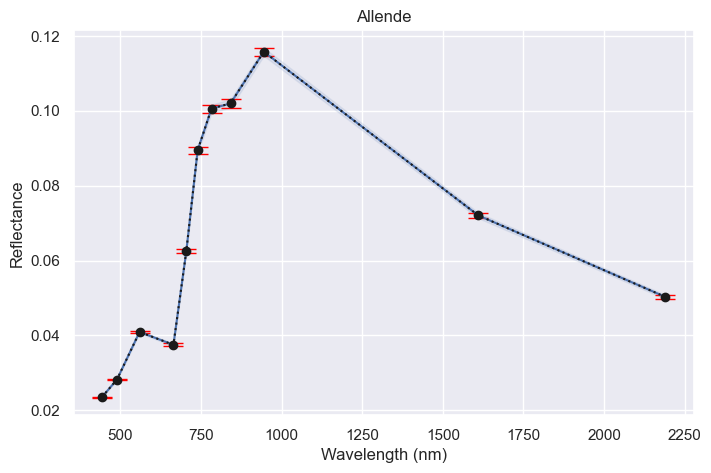

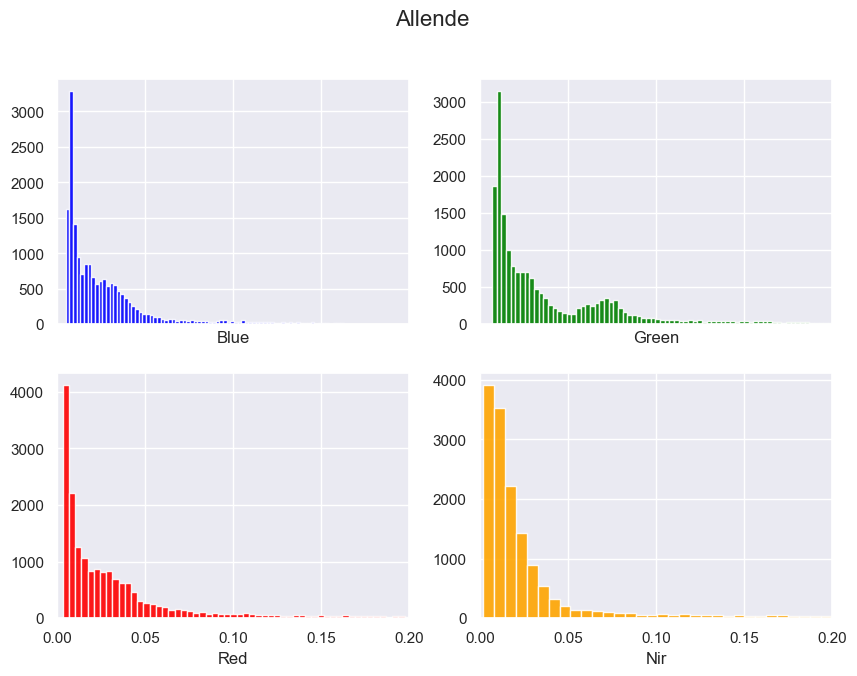

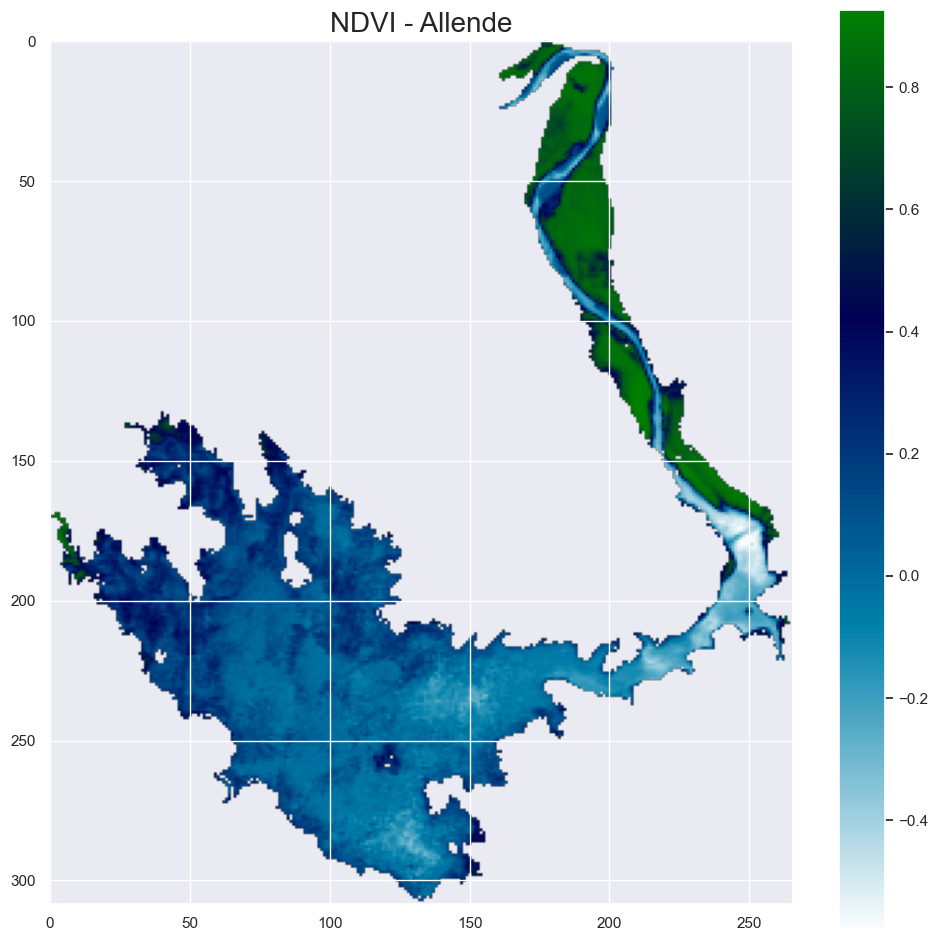

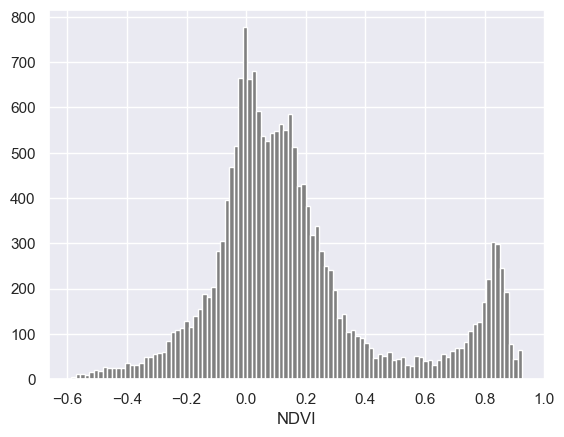

...

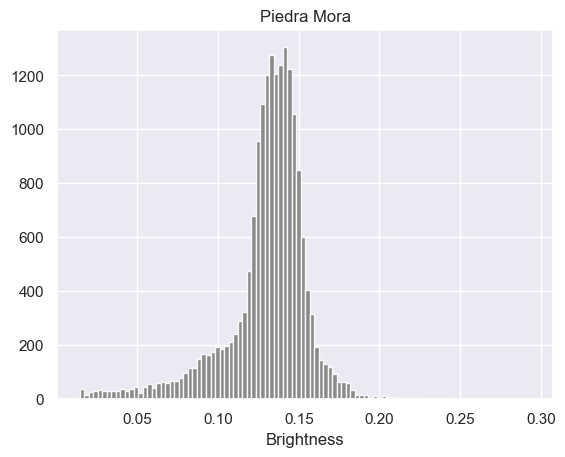

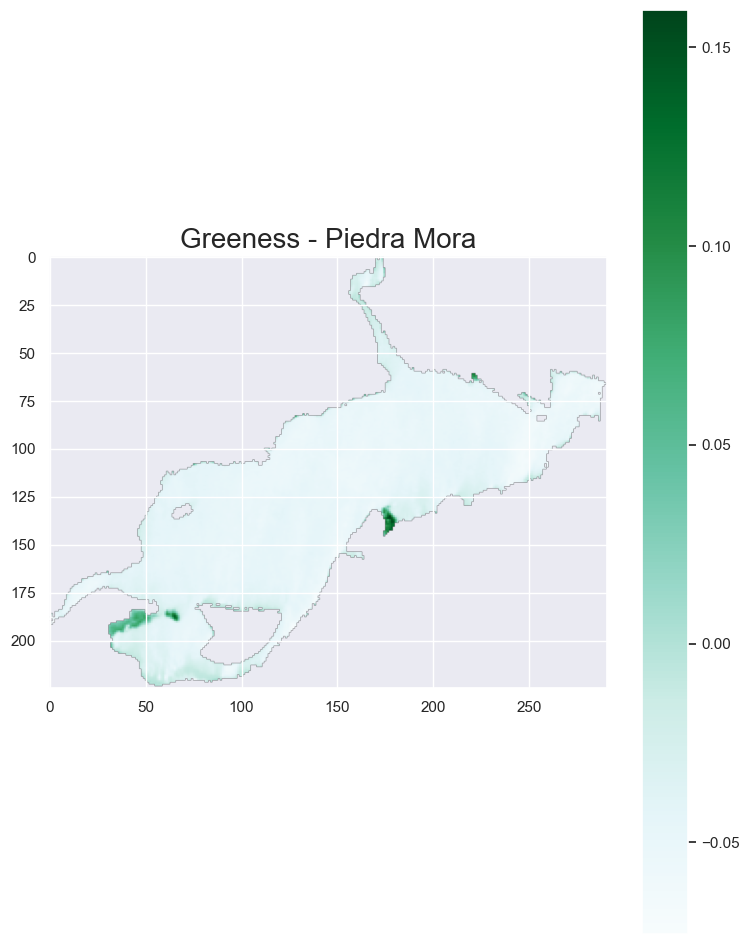

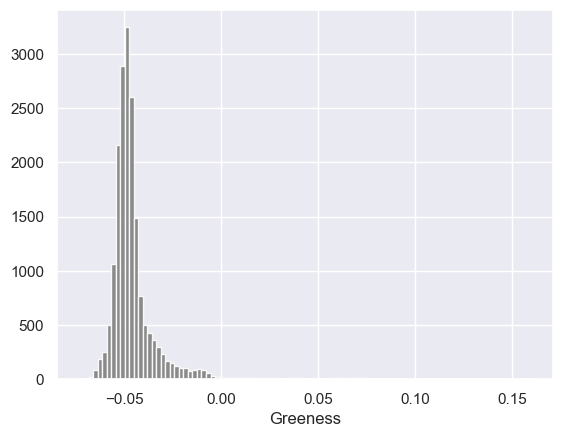

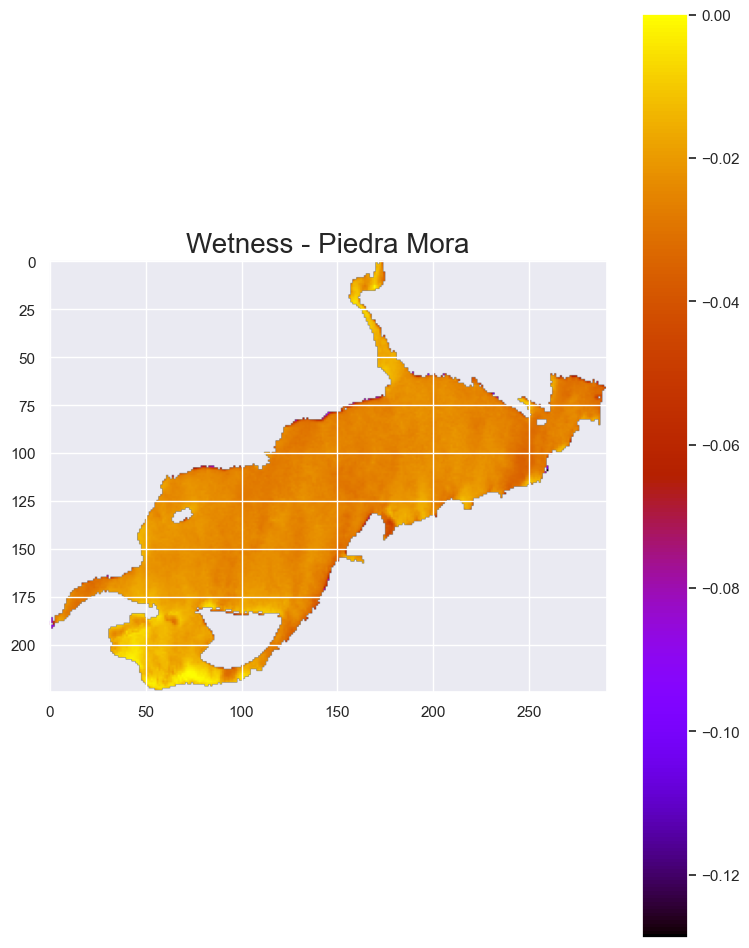

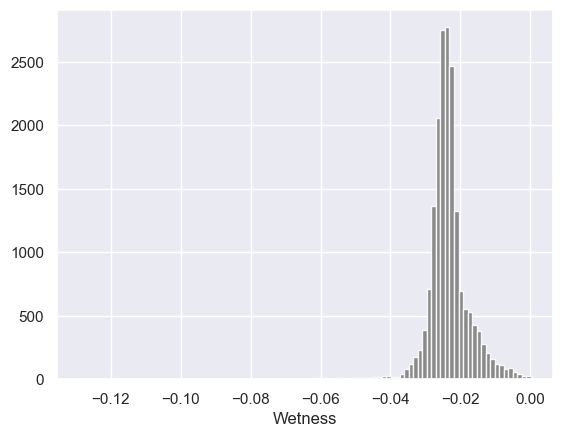

In [170]:
# Wavelengths (nm) matching this stack's actual band order:
# Band1, Blue, Green, Red, Band5, Band6, Band7, NIR, Band9, SWIR1, SWIR2
long = [443, 490, 560, 665, 705, 740, 783, 842, 945, 1610, 2190]
short = [490, 560, 665, 842]  # Blue, Green, Red, NIR

radiosAux = radiosSur

# The South reservoirs are outside Norte_20mTODOS.tif's extent, so we need
# to reopen s2 against the Sur raster before cropping by polygon.
s2.close()
s2 = rasterio.open('ImagenesSentinel/Sur_20mTODOS.tif')
os.makedirs('Plots', exist_ok=True)

if radiosAux.shape == radiosSur.shape:
    IDN = [0,1,2,3,4,5,6,7]
else:
    IDN = [0,1,2]
# print(IDN)

for ID in IDN:
    IDEmbalse = ID
    reescalado = 10000
    
    indicesTC = [1,2,3,7,9,10] #Blue, Green, Red, NIR, SWIR1, SWIR2 (actual band order in this 11-band stack)
    indiceRed = 3
    indiceBlue = 1
    
    nombre = radiosAux.loc[IDEmbalse].fna
    poligono = radiosAux.loc[IDEmbalse].geometry #geometry of the eighth element of the shp
    s2_plot_extent = plotting_extent(s2) #Edges of the region to plot

    # CROP THE AREA OF INTEREST
    extent = poligono.envelope

    # data = [poligono, extent]
    # gpd.GeoSeries(data).boundary.plot(color=['b', 'r'])

    s2_clip, clip_transform = mask(dataset = s2, shapes = [extent], crop = True)
    s2_mask, mask_transform  = mask(dataset = s2, shapes = [poligono], crop = True)
    
    
    
    blue = delNone(s2_mask[indiceBlue],0,reescalado)
    green = delNone(s2_mask[2],0,reescalado)
    red = delNone(s2_mask[indiceRed],0,reescalado)
    nir = delNone(s2_mask[7],0,reescalado)  # NIR is at index 7
    
    means = []
    desvs = []
    for i in range(len(s2_mask)):
        aux = delNone(s2_mask[i],0,reescalado)
        means.append(np.mean(aux))
        desvs.append(np.std(aux)/np.sqrt(len(aux)))


    
    means2 = [means[1], means[2], means[3], means[7]]  # Blue, Green, Red, NIR
    desvs2 = [desvs[1], desvs[2], desvs[3], desvs[7]]
    
    means = np.asarray(means)
    desvs = np.asarray(desvs)
    means2 = np.asarray(means2)
    desvs2 = np.asarray(desvs2)
    
    plt.figure(figsize = (8,5))
    plt.errorbar(short, means2, marker = 'o', yerr = desvs2, elinewidth = 1, ls = 'dotted', color = 'k', ecolor = 'red', capsize=7)
    plt.plot(short, means2)#, label=l)
    plt.fill_between(short, means2-desvs2, (means2+desvs2), color='b', alpha=.1)
    plt.xlabel('Wavelength (nm)')
    plt.ylabel('Reflectance')
    plt.title(nombre)
    plt.savefig('Plots/firmasRGBNIR_'+nombre+'.png', dpi=200)
    
    
    plt.figure(figsize = (8,5))
    plt.errorbar(long, means, marker = 'o', yerr = desvs, elinewidth = 1, ls = 'dotted', color = 'k', ecolor = 'red', capsize=7)
    plt.plot(long, means)#, label=l)
    plt.fill_between(long, means-desvs, (means+desvs), color='b', alpha=.1)
    plt.xlabel('Wavelength (nm)')
    plt.ylabel('Reflectance')
    plt.title(nombre)
    plt.savefig('Plots/firmas_'+nombre+'.png', dpi=200)
    
    fig, ax = plt.subplots(2,2, sharex = True, figsize = (10,7))
    ax[0,0].hist(blue, 100, alpha = 0.9, label = 'Blue', color = 'blue');
    ax[0,1].hist(green, 100, alpha = 0.9, label = 'Green', color = 'green');
    ax[1,0].hist(red, 100, alpha = 0.9, label = 'Red', color = 'red');
    ax[1,1].hist(nir, 100, alpha = 0.9, label = 'NIR', color = 'orange');
    ax[0,0].set_xlim(0,0.2)

    ax[0,0].set_xlabel('Blue')
    ax[0,1].set_xlabel('Green')
    ax[1,0].set_xlabel('Red')
    ax[1,1].set_xlabel('Nir')
    fig.suptitle(nombre, fontsize=16)

    fig.savefig('Plots/HistoRGBNIR_'+nombre+'.png', dpi = 200)
    
    # Documentos Facultad - Conicet/Cursos/Tele - UNSAM/Scipts/Plots
    plt.figure(figsize=(12,12))
    plt.imshow(ndvi(s2_mask,indiceRed,7,10000), cmap='ocean_r')
    plt.colorbar()
    plt.title('NDVI - '+nombre,  fontsize = 20)
    plt.savefig('Plots/ndvi_'+nombre+'.png', dpi = 300)
    
    plt.figure()
    plt.hist(ndvi(s2_mask,indiceRed,7, 10000).flatten(), 100, color='gray')
    plt.xlabel('NDVI')
    plt.savefig('Plots/ndvi_'+nombre+'-histograma.png', dpi = 300)
    
    plt.figure(figsize=(12,12))
    plt.imshow(indice(s2_mask,2,7,10000), cmap='ocean')  # NDWI: Green(2), NIR(7)
    plt.colorbar()
    plt.title('NDWI - '+nombre,  fontsize = 20)
    plt.savefig('Plots/ndwi_'+nombre+'.png', dpi = 300)

    # os.chdir("C:\\Users\\arell\\Documents\\Sentinel")

    
    matriz = []
    matriz2 = []
    coeficientesS2 = [[0.3510, 0.3813, 0.3437, 0.7196, 0.2396, 0.1949],
                      [-0.3599, -0.3533, -0.4734, 0.6633, 0.0087, -0.2856],
                      [0.2578, 0.2305, 0.0883, 0.1071, -0.7611, -0.5308]] 

    for i in indicesTC:
        # matriz.append(s2_clip[i]/reescalado)
        matriz2.append(s2_mask[i]/reescalado)

    # [brillo, verdor, humedad] = np.einsum('ij,jkl->ikl', coeficientesS2,matriz)
    [brilloM, verdorM, humedadM] = np.einsum('ij,jkl->ikl', coeficientesS2,matriz2)
    
    brilloM[brilloM==0] = np.nan
    verdorM[verdorM==0] = np.nan
    humedadM[humedadM==0] = np.nan
    
    # os.chdir("D:\\Documentos Facultad - Conicet\Cursos\Tele - UNSAM\Scipts")
    # nombre += '-mask'
    
    masked_arrayB = np.ma.array(brilloM, mask=np.isnan(brilloM))
    plt.figure(figsize = (9,12))
    plt.imshow(masked_arrayB, cmap='magma')
    plt.colorbar()
    plt.title('Brightness - '+nombre,  fontsize = 20)
    # plt.savefig('Plots/Brightness_'+nombre+'.png', dpi = 300)
    
    plt.figure()
    plt.hist(brilloM[brilloM!=np.nan].flatten(), 100, alpha = 0.9, color='gray');
    plt.xlabel('Brightness')
    plt.title(nombre)
    # plt.savefig('Plots/Brightness_'+nombre+'-histograma.png', dpi = 300)

    masked_arrayV = np.ma.array(verdorM, mask=np.isnan(verdorM))
    plt.figure(figsize = (9,12))
    plt.imshow(masked_arrayV, cmap='BuGn')
    plt.colorbar()
    plt.title('Greeness - '+nombre,  fontsize = 20)
    # plt.savefig('Plots/Greeness_'+nombre+'.png', dpi = 300)
    
    plt.figure()
    plt.hist(verdorM[verdorM!=np.nan].flatten(), 100, alpha = 0.9, color='gray');
    plt.xlabel('Greeness')
    # plt.savefig('Plots/Greeness_'+nombre+'-histograma.png', dpi = 300)
    
    masked_arrayH = np.ma.array(humedadM, mask=np.isnan(humedadM))
    plt.figure(figsize = (9,12))
    plt.imshow(masked_arrayH, cmap='gnuplot')
    plt.colorbar()
    plt.title('Wetness - '+nombre,  fontsize = 20)
    # plt.savefig('Plots/Wetness_'+nombre+'.png', dpi = 300)

    plt.figure()
    plt.hist(humedadM[humedadM!=np.nan].flatten(), 100, alpha = 0.9, color='gray');
    plt.xlabel('Wetness')
    # plt.savefig('Plots/Wetness_'+nombre+'-histograma.png', dpi = 300)

------------
Statistics
----------

In [171]:
data=pd.DataFrame({'B':blue,'G':green,'R':red,'NIR':nir})#,'NDVI':ndvi(s2_mask,2,3).flatten()})#,'clase':[clases[y] for y in Y]})

<Axes: >

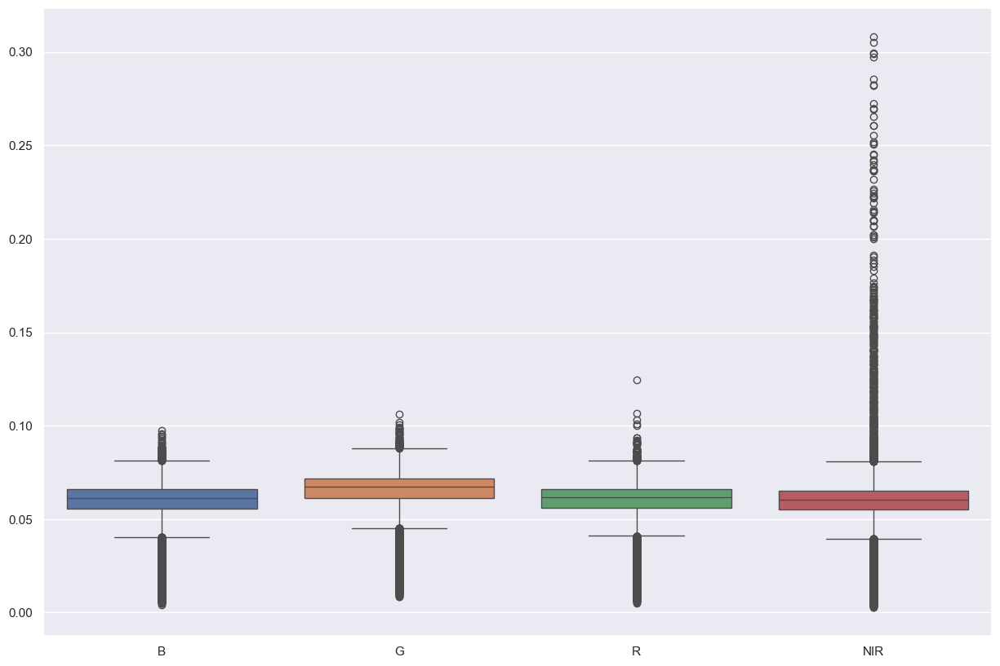

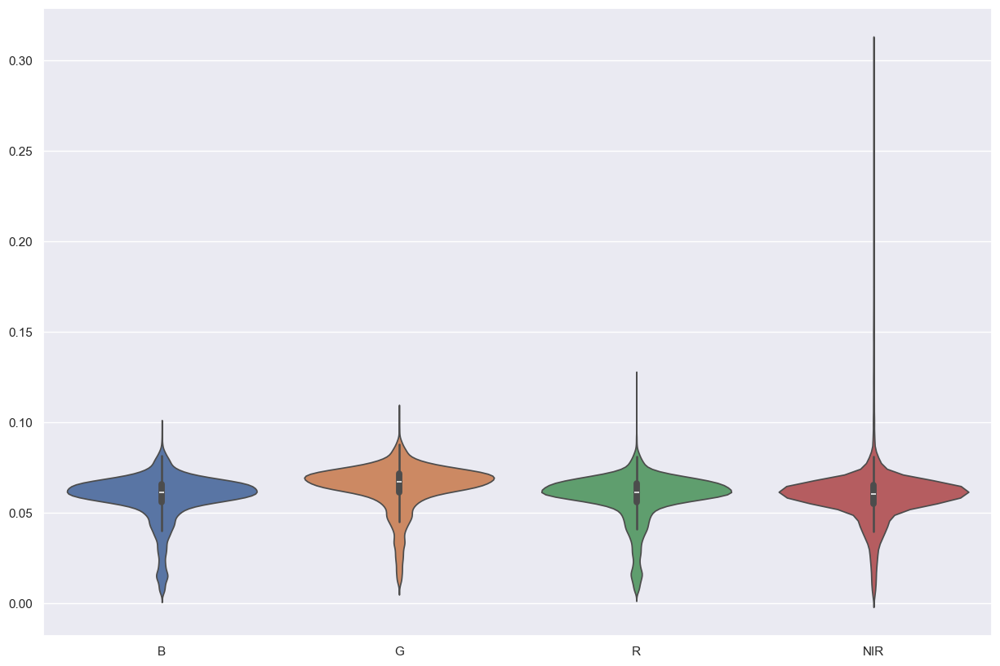

In [172]:
fig = plt.figure(figsize=(15,10))
sns.boxplot(data=data)#,x='clase', y='NDVI')
# plt.savefig('SalidasSur/boxplot.png',dpi=200)
fig = plt.figure(figsize=(15,10))
sns.violinplot(data=data)#,x='clase', y='NDVI')
# plt.savefig('SalidasSur/violinlot.png',dpi=200)

<Axes: xlabel='R', ylabel='G'>

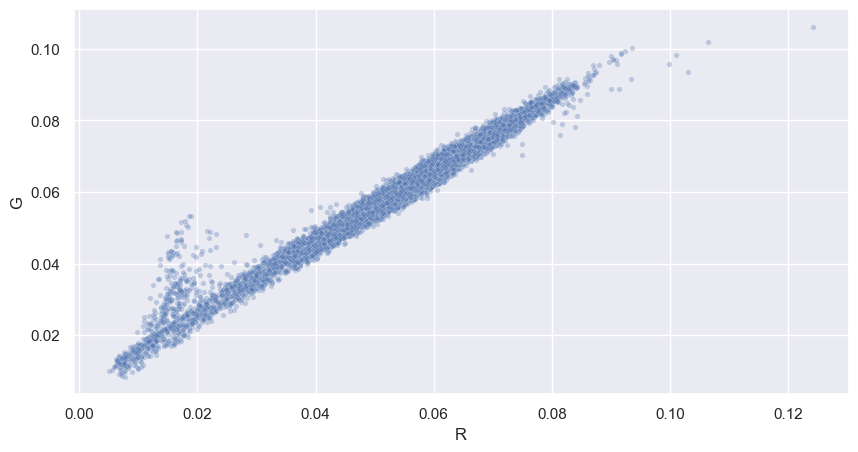

In [173]:
fig = plt.figure(figsize=(10,5))
sns.scatterplot(data=data, x='R', y='G', alpha=0.3, s=15)
# plt.savefig('SalidasSur/scatterplot.png')

Text(0, 0.5, 'Counts')

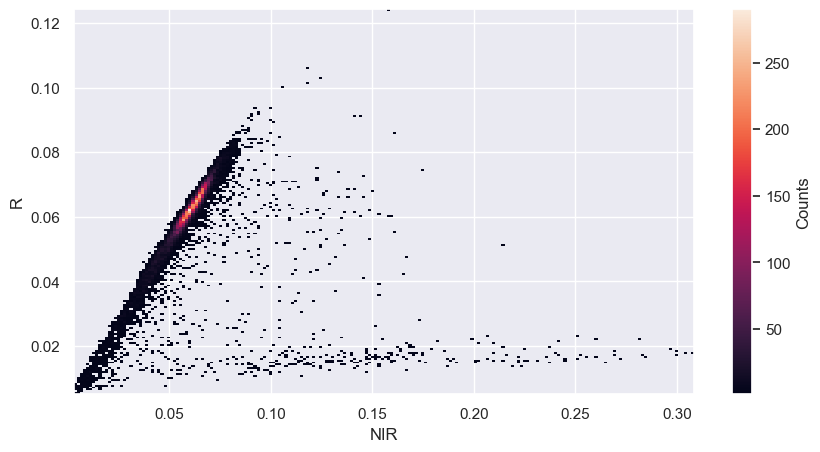

In [174]:
bandx = 'NIR'
bandy = 'R'
# Estimate the 2D histogram
nbins = 200
H, xedges, yedges = np.histogram2d(data[bandx],data[bandy],bins=nbins)
 
# H needs to be rotated and flipped
H = np.rot90(H)
H = np.flipud(H)
 
# Mask zeros
Hmasked = np.ma.masked_where(H==0,H) # Mask pixels with a value of zero
 
# Plot 2D histogram using pcolor
fig2 = plt.figure(figsize=(10,5))
# sns.jointplot(data=data, x=bandx, y=bandy)l<
plt.pcolormesh(xedges,yedges,Hmasked)
plt.xlabel(bandx)
plt.ylabel(bandy)
cbar = plt.colorbar()
cbar.ax.set_ylabel('Counts')

<Figure size 640x480 with 0 Axes>

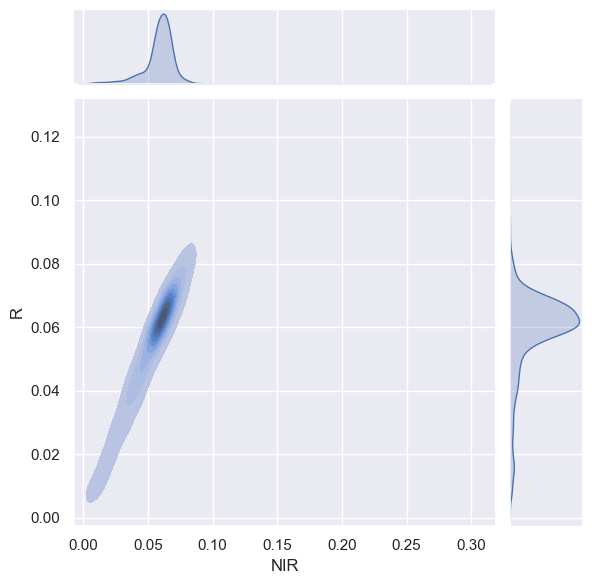

In [176]:
plt.figure()
sns.jointplot(data=data, x=bandx, y=bandy, kind='kde', fill=True)
# plt.savefig('SalidasSur/scatterplot.png',dpi=200)

In [177]:
bluee = s2_mask[0]/10000
greenn = s2_mask[1]/10000
redd = s2_mask[2]/10000
nirr = s2_mask[3]/10000

redd[redd == 0] = np.nan
greenn[greenn == 0] = np.nan
bluee[bluee == 0] = np.nan
nirr[nirr == 0] = np.nan 

# plt.hist(redd[np.isfinite(redd)], 50);
# plt.hist(redd.flatten(), 50);

In [178]:
bluee = s2_mask[0]/10000
greenn = s2_mask[1]/10000
redd = s2_mask[2]/10000
nirr = s2_mask[3]/10000

bluee2 = bluee[(bluee!=0)]
greenn2 = greenn[greenn!=0]
redd2 = redd[redd!=0]
nirr2 = nirr[nirr!=0]

In [179]:
np.where(bluee2 == np.max(bluee2))

(array([6110]),)

In [180]:
max(bluee2)

np.float64(0.066)

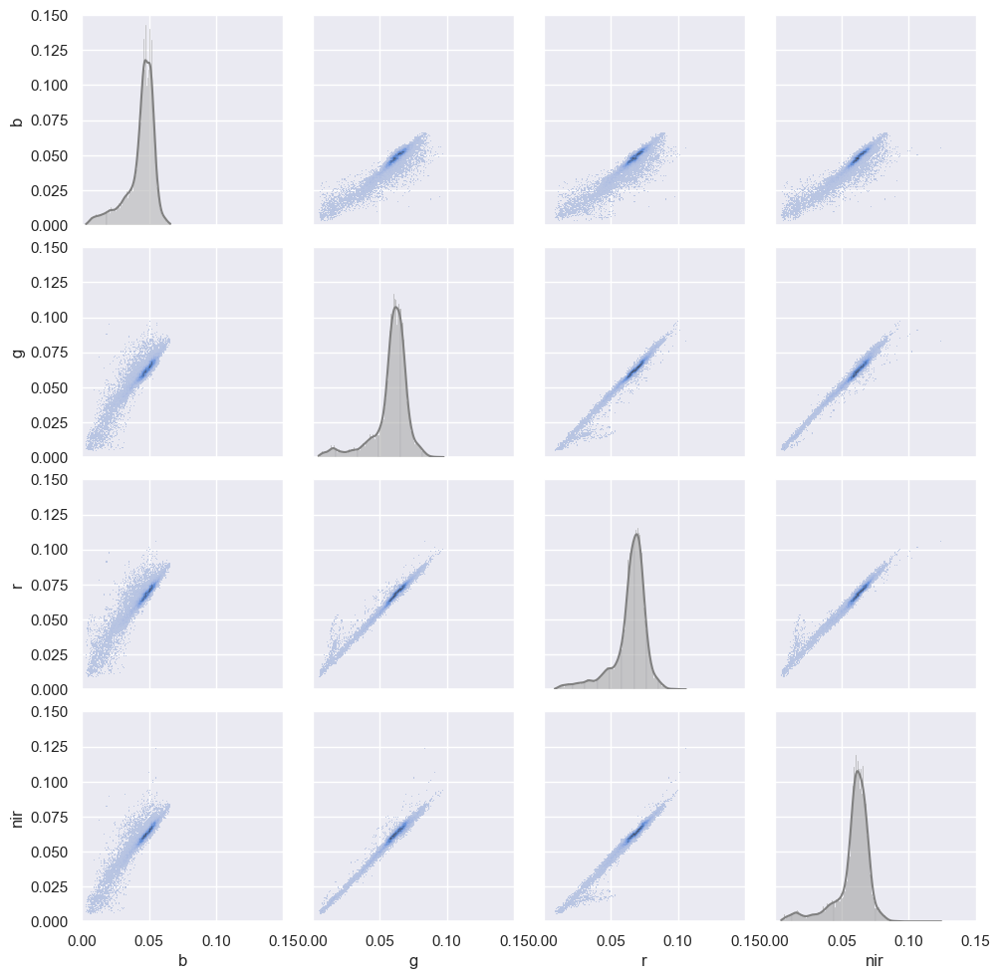

In [181]:
# stack_data = np.stack((bluee[np.isfinite(bluee)],greenn[np.isfinite(greenn)],redd[np.isfinite(redd)],nirr[np.isfinite(nirr)])).T
stack_data2 = np.stack((bluee2, greenn2, redd2, nirr2)).T
data = pd.DataFrame(stack_data2, columns = ['b','g','r','nir'])

f = sns.PairGrid(data)
# f.fig.suptitle(Nombre, y=1.01, fontsize = 'large')
f.map_upper(sns.histplot)
f.map_lower(sns.histplot)
f.map_diag(sns.histplot, kde=True, color='.5')
f.set(xlim = (0,0.15), ylim = (0,0.15))

In [182]:
# stack_data = np.stack((bluee[np.isfinite(bluee)],greenn[np.isfinite(greenn)],redd[np.isfinite(redd)],nirr[np.isfinite(nirr)])).T
stack_data2 = np.stack((bluee2, greenn2, redd2, nirr2)).T
data = pd.DataFrame(stack_data2, columns = ['b','g','r','nir'])

# f = sns.PairGrid(data)
# # f.fig.suptitle(Nombre, y=1.01, fontsize = 'large')
# f.map_upper(sns.kdeplot, fill = True)
# f.map_lower(sns.histplot)
# f.map_diag(sns.histplot, kde=True, color='.5')
# f.set(xlim = (0,0.15), ylim = (0,0.15))

In [183]:
S = np.zeros((6,6))
b_mean = np.mean(data['b'])

In [184]:
data.mean

<bound method DataFrame.mean of             b       g       r     nir
0      0.0125  0.0223  0.0267  0.0204
1      0.0143  0.0224  0.0304  0.0215
2      0.0124  0.0167  0.0187  0.0150
3      0.0144  0.0279  0.0343  0.0266
4      0.0158  0.0273  0.0341  0.0256
...       ...     ...     ...     ...
18533  0.0093  0.0196  0.0254  0.0197
18534  0.0054  0.0085  0.0164  0.0106
18535  0.0058  0.0078  0.0160  0.0101
18536  0.0062  0.0081  0.0153  0.0094
18537  0.0072  0.0084  0.0134  0.0091

[18538 rows x 4 columns]>

<Axes: xlabel='r', ylabel='b'>

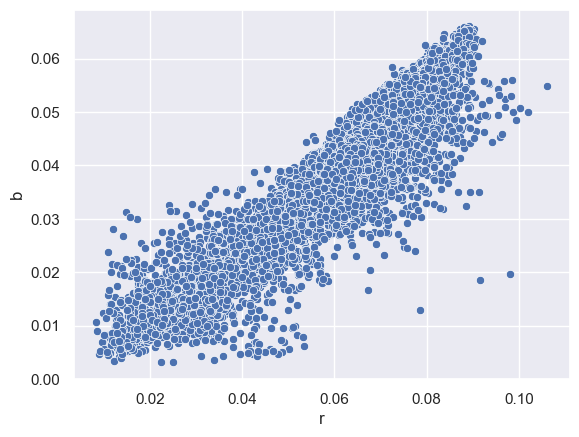

In [185]:
sns.scatterplot(data = data, x = 'r', y = 'b')